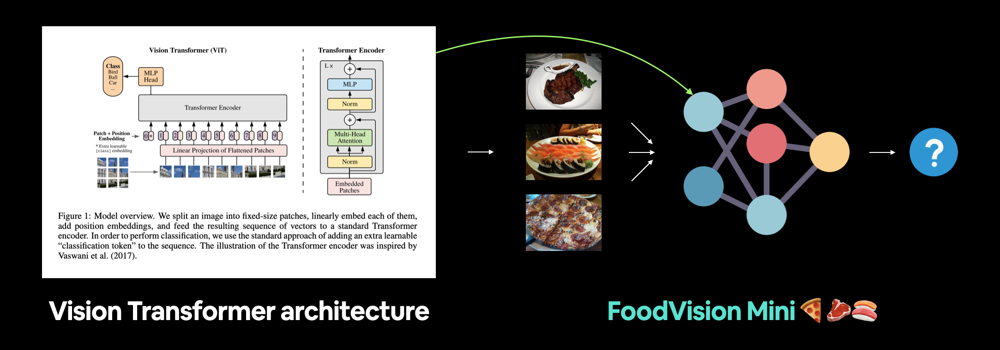

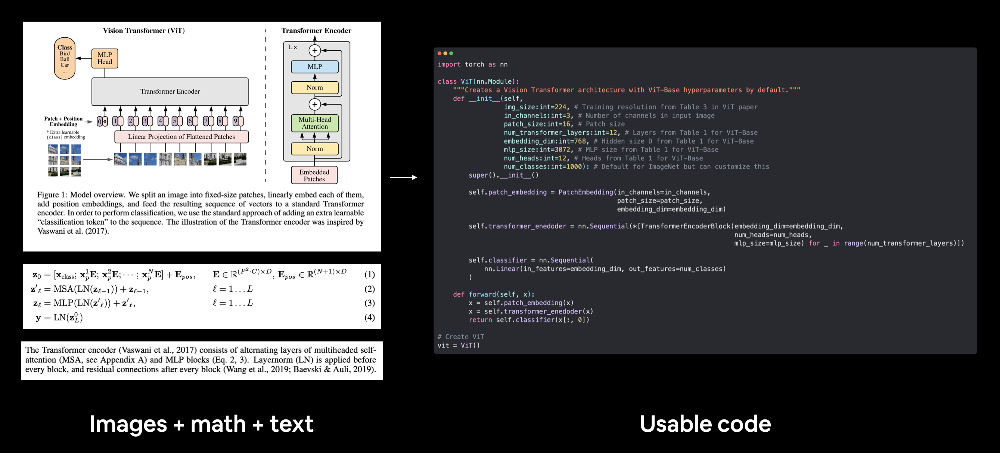

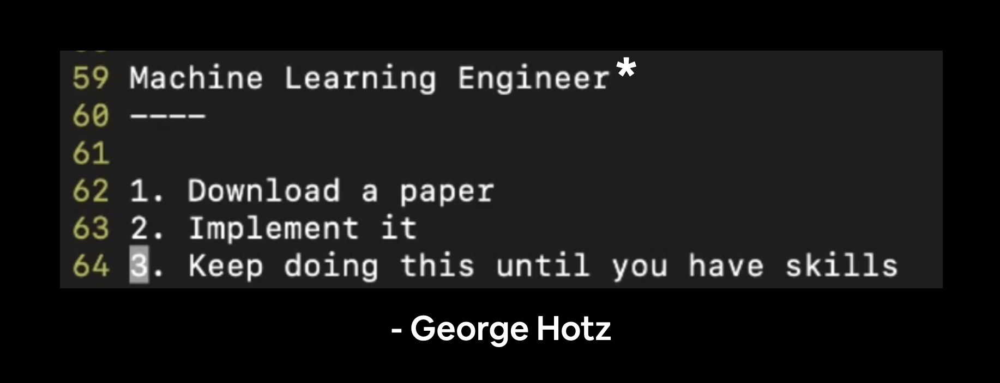

###  *Getting setup*

In [1]:
try:
  import torch
  import torchvision
  assert int(torch.__version__.split(".")[1]) >= 12
  assert int(torchvision.__version__.split(".")[1]) >= 12
  print(f"torch version: {torch.__version__}")
  print(f"torchvision version: {torchvision.__version__}")

except:
  print("[INFO] torch/torchvision versions donot as required , installing nightly versions.")
  !pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113
  import torch
  import torchvision
  print(f"torch version:{torch.__version__}")
  print(f"torchvision version:{torchvision.__version__}")

torch version: 1.13.1+cu116
torchvision version: 0.14.1+cu116


In [2]:
import matplotlib.pyplot as plt
import torch
import torchvision
from torch import nn
from torchvision import transforms

try:
  from torchinfo import summary
except:
  !pip install torchinfo
  from torchinfo import summary

try:
  from going_modular.going_modular import data_setup, engine
  from helper_functions import download_data, set_seeds, plot_loss_curves
except:
  print("[INFO] Couldn't find going_modular or helper_functions, downloading them from Github.")
  !git clone https://github.com/mrdbourke/pytorch-deep-learning
  !mv pytorch-deep-learning/going_modular .
  !mv pytorch-deep-learning/helper_functions.py .
  !rm -rf pytorch-deep-learning
  from going_modular.going_modular import data_setup, engine
  from helper_functions import download_data, set_seeds, plot_loss_curves


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
[INFO] Couldn't find going_modular or helper_functions, downloading them from Github.
Cloning into 'pytorch-deep-learning'...
remote: Enumerating objects: 3435, done.
remote: Counting objects: 100% (133/133), done.
remote: Compressing objects: 100% (87/87), done.
remote: Total 3435 (delta 55), reused 97 (delta 41), pack-reused 3302
Receiving objects: 100% (3435/3435), 643.59 MiB | 42.50 MiB/s, done.
Resolving deltas: 100% (1962/1962), done.
Updating files: 100% (222/222), done.


In [3]:
device= "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

### *Get data* 

In [4]:
# Download pizza, steak, sushi images from GitHub
image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] Did not find data/pizza_steak_sushi directory, creating one...
[INFO] Downloading pizza_steak_sushi.zip from https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip...
[INFO] Unzipping pizza_steak_sushi.zip data...


PosixPath('data/pizza_steak_sushi')

In [5]:
train_dir= image_path/ "train"
test_dir= image_path/ "test"

## *Create datasets and dataloaders*
## 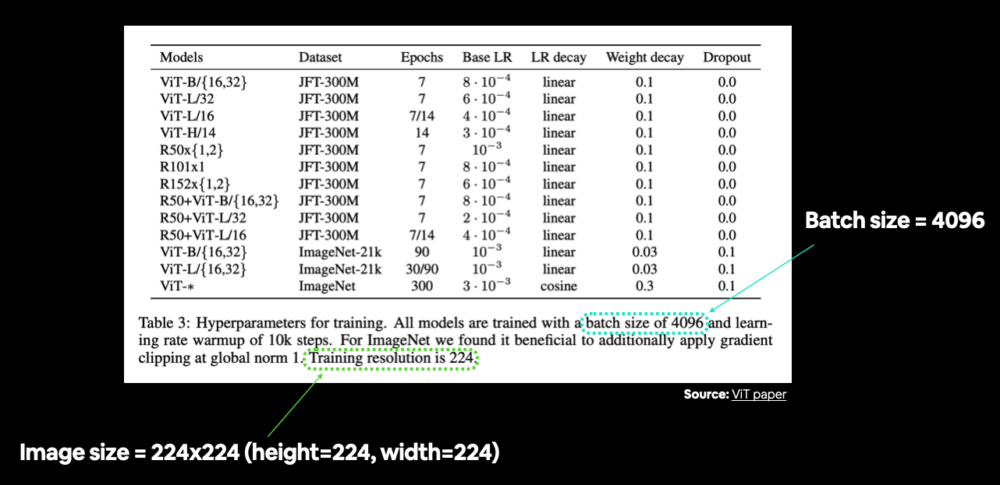

### *Prepare transforms for image*

In [6]:
IMG_SIZE= 224

manual_transforms= transforms.Compose([transforms.Resize((IMG_SIZE, IMG_SIZE)), transforms.ToTensor()])
manual_transforms

Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=None)
    ToTensor()
)

### *Turn images into dataloaders*

In [7]:
BATCH_SIZE= 32

train_dataloader, test_dataloader, class_names= data_setup.create_dataloaders( train_dir= train_dir, test_dir= test_dir, transform= manual_transforms, batch_size= BATCH_SIZE)

train_dir, test_dir, class_names

(PosixPath('data/pizza_steak_sushi/train'),
 PosixPath('data/pizza_steak_sushi/test'),
 ['pizza', 'steak', 'sushi'])

In [8]:
img_batch, label_batch= next(iter(train_dataloader))
img, label= img_batch[0], label_batch[0]
img.shape, label

(torch.Size([3, 224, 224]), tensor(1))

### *Visualize a single image*

(-0.5, 223.5, 223.5, -0.5)

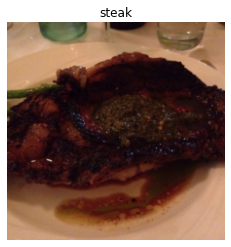

In [9]:
plt.imshow(img.permute(1,2,0))
plt.title(class_names[label])
plt.axis(False)

## *Replicating a VIT paper an overview*
## *Inputs, outputs, layers and blocks*
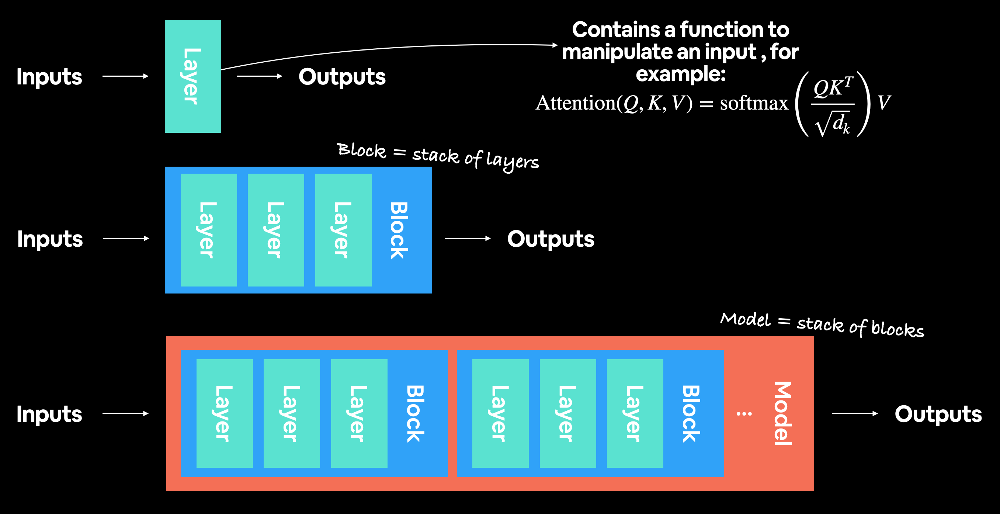

# *Architecture and Equations*
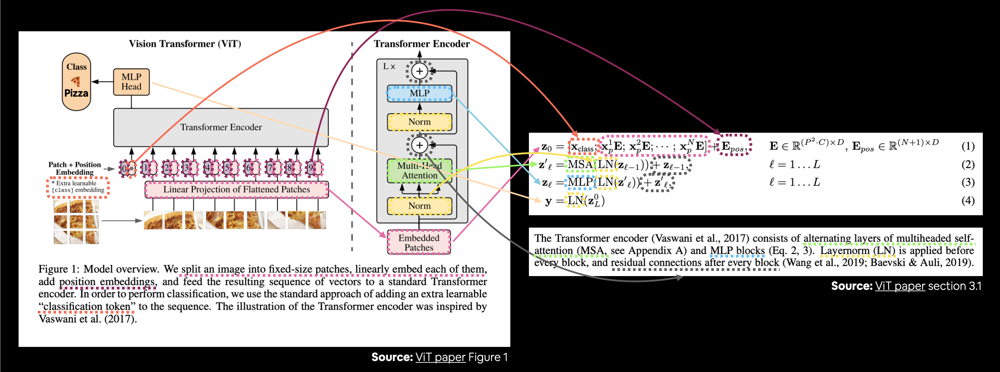

#  Equation 1: Split data into patches and creating the class, position and patch embedding
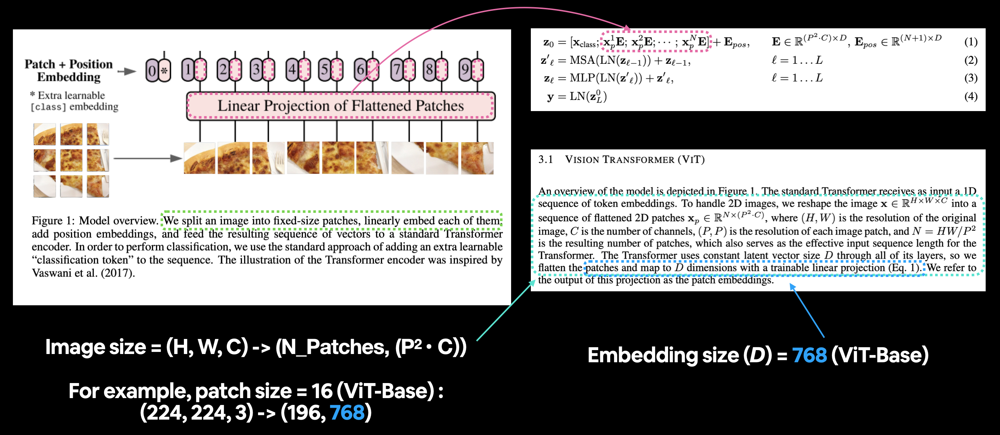

### *Calculating patch embedding input and output shapes by hand*

In [10]:
height= 224
width= 224
color_channels= 3
patch_size= 16

number_of_patches= int((height * width)/ patch_size **2)
print(f"Number of patches (N)  with Height={height}, and Width= {width}, N={number_of_patches} ")

Number of patches (N)  with Height=224, and Width= 224, N=196 


In [11]:
embedding_layer_input_shape= (height, width, color_channels)
embedding_layer_output_shape= (number_of_patches, patch_size **2 * color_channels)
print(f"Input shape (single 2D image): {embedding_layer_input_shape}")
print(f"Output shape (single image with flattened 2D patches): {embedding_layer_output_shape}")

Input shape (single 2D image): (224, 224, 3)
Output shape (single image with flattened 2D patches): (196, 768)


### *Turning a single image into patches*

(-0.5, 223.5, 223.5, -0.5)

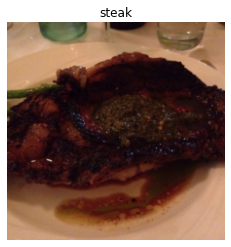

In [12]:
plt.imshow(img.permute(1,2,0))
plt.title(class_names[label])
plt.axis('off')

(-0.5, 223.5, 15.5, -0.5)

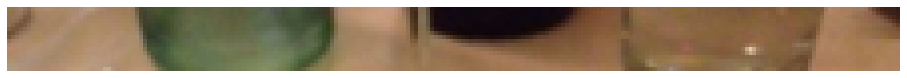

In [13]:
img_permuted= img.permute(1,2,0)
patch_size= 16
plt.figure(figsize= (patch_size, patch_size))
plt.imshow(img_permuted[:patch_size, :,:])
plt.axis('off')

Number of patches per row: 14.0
 Patch size: 16 pixels x 16 pixels


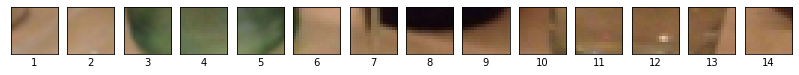

In [14]:
img_size= 224
patch_size= 16
num_patches= img_size / patch_size
assert img_size % patch_size== 0, "image size must be devisible by patch size."
print(f"Number of patches per row: {num_patches}\n Patch size: {patch_size} pixels x {patch_size} pixels")
fig, axs= plt.subplots(nrows= 1, ncols= img_size // patch_size, figsize= (num_patches, num_patches), sharex=True, sharey=True)

for i, patch in enumerate(range(0, img_size, patch_size)):
  #print(patch)
  axs[i].imshow(img_permuted[:patch_size, patch: patch+ patch_size, :])
  axs[i].set_xlabel(i+1)
  axs[i].set_xticks([])
  axs[i].set_yticks([])


Number of patches per row : 14.0
 Number of patches per column: 14.0
 Total patches: 196.0
 patch size: 16pixels x 16pixels


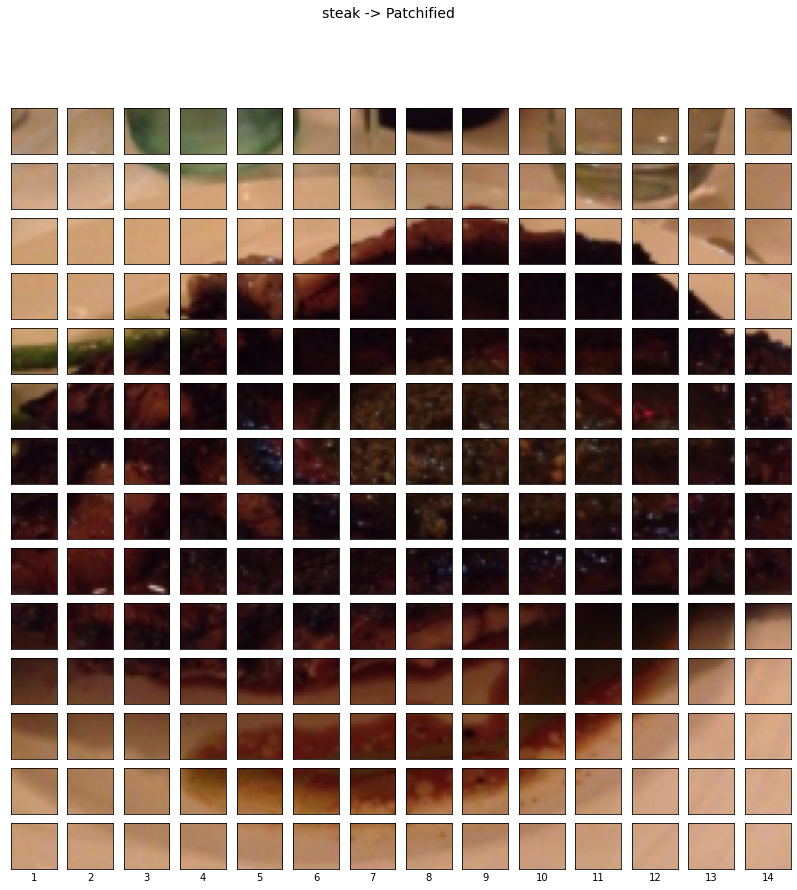

In [15]:
img_size= 224
patch_size= 16
num_patches= img_size/ patch_size
assert img_size % patch_size == 0, "image size must be devisible by patch size."
print(f"Number of patches per row : {num_patches}\n Number of patches per column: {num_patches}\n Total patches: {num_patches * num_patches}\n patch size: {patch_size}pixels x {patch_size}pixels")
fig, axs= plt.subplots(nrows= img_size//patch_size, ncols= img_size// patch_size, figsize= (num_patches, num_patches), sharex= True, sharey= True)

for i, patch_height in enumerate(range(0, img_size, patch_size)):
  for j, patch_width in enumerate(range(0, img_size, patch_size)):
    axs[i,j].imshow(img_permuted[patch_height:patch + patch_height,patch_width: patch_width + patch_size, :])
    axs[i,j].set_xlabel(j+1)
    axs[i,j].set_xticks([])
    axs[i,j].set_yticks([])
    axs[i,j].label_outer()


fig.suptitle(f"{class_names[label]} -> Patchified", fontsize= 14)
plt.show()

## *Creating image patches with torch.nn.Conv2d()*

In [16]:
from torch import nn
patch_size= 16

conv2d= nn.Conv2d(in_channels= 3, out_channels= 768, kernel_size= patch_size, stride= patch_size, padding= 0)


(-0.5, 223.5, 223.5, -0.5)

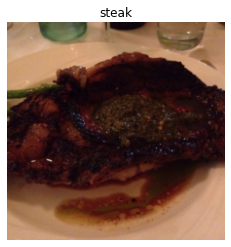

In [17]:
plt.imshow(img.permute(1,2,0))
plt.title(class_names[label])
plt.axis("off")

In [18]:
image_out_of_conv= conv2d(img.unsqueeze(dim= 0))
print(image_out_of_conv.shape)

torch.Size([1, 768, 14, 14])


Showing random convolutional feature maps from indexes:[119, 10, 704, 582, 613]


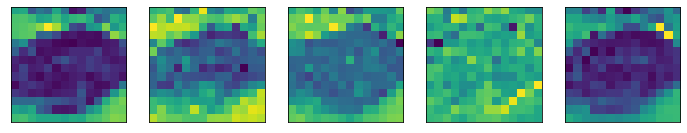

In [19]:
import random
random_indexes= random.sample(range(0, 768), k= 5)
print(f"Showing random convolutional feature maps from indexes:{random_indexes}")
fig, axs= plt.subplots(nrows= 1, ncols=5, figsize= (12,12))

for i, idx in enumerate(random_indexes):
  image_conv_feature_map= image_out_of_conv[:, idx,:,:]
  axs[i].imshow(image_conv_feature_map.squeeze().detach().numpy())
  axs[i].set(xticklabels=[], yticklabels=[],xticks=[],yticks=[])


In [20]:
single_feature_map= image_out_of_conv[:,768-1,:,:]
single_feature_map, single_feature_map.requires_grad

(tensor([[[-0.4855, -0.5363, -0.2981, -0.3955, -0.3585, -0.5474, -0.2805,
           -0.2316, -0.2248, -0.3525, -0.3590, -0.3294, -0.3522, -0.4187],
          [-0.6217, -0.6233, -0.6311, -0.5064, -0.5323, -0.5749, -0.4967,
           -0.4767, -0.4792, -0.4637, -0.4112, -0.3413, -0.3751, -0.4811],
          [-0.6442, -0.5989, -0.5971, -0.6019, -0.5120, -0.5891, -0.3549,
           -0.0774, -0.0803, -0.2661, -0.3835, -0.4646, -0.5388, -0.5225],
          [-0.5799, -0.6015, -0.5734, -0.1640, -0.1630, -0.1182, -0.0241,
           -0.0390, -0.0417, -0.0500, -0.0403, -0.0439, -0.4406, -0.6104],
          [-0.4259, -0.2991, -0.1553, -0.0708, -0.0334, -0.0454, -0.0547,
           -0.0718, -0.0713, -0.0661, -0.0529, -0.0398, -0.1119, -0.1832],
          [-0.1970, -0.0515, -0.1090, -0.0258, -0.0419, -0.0625, -0.1128,
           -0.0833, -0.0806, -0.0855, -0.0814, -0.0898, -0.0888, -0.0737],
          [-0.0667, -0.0559, -0.1213, -0.0633, -0.1481, -0.1202, -0.1092,
           -0.0851, -0.0803, -0.

In [21]:
print(f"Current tensor type: {image_out_of_conv.shape}-> [batch, embedding_dim, feature_map_height, feature_map_width]")

Current tensor type: torch.Size([1, 768, 14, 14])-> [batch, embedding_dim, feature_map_height, feature_map_width]


### *Flattening the patch embedding with torch.nn.Flatten()*

In [22]:
flatten= nn.Flatten(start_dim=2, end_dim= 3)

Original image shape:torch.Size([3, 224, 224])
Image feature map shape:torch.Size([1, 768, 14, 14])
Image feature map shape with flatten:torch.Size([1, 768, 196])


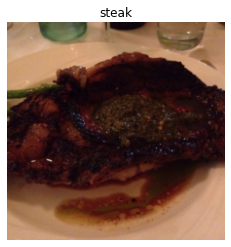

In [23]:
plt.imshow(img.permute(1,2,0))
plt.title(class_names[label])
plt.axis("off")
print(f"Original image shape:{img.shape}")

image_out_of_conv= conv2d(img.unsqueeze(dim=0))
print(f"Image feature map shape:{image_out_of_conv.shape}")
image_out_of_conv_flatten= flatten(image_out_of_conv)
print(f"Image feature map shape with flatten:{image_out_of_conv_flatten.shape}")

In [24]:
image_out_of_conv_flatten_reshape= image_out_of_conv_flatten.permute(0,2,1)
print(f"Reshape flattened image through conv layer:{image_out_of_conv_flatten_reshape.shape}-> [batch_size, num_patches, embedding_size]")

Reshape flattened image through conv layer:torch.Size([1, 196, 768])-> [batch_size, num_patches, embedding_size]


(-0.5, 195.5, 0.5, -0.5)

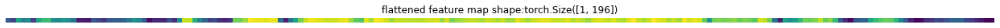

In [25]:
single_flattened_feature_map= image_out_of_conv_flatten_reshape[:,:, 768-1]
plt.figure(figsize=(22,22))
plt.imshow(single_flattened_feature_map.detach().numpy())
plt.title(f"flattened feature map shape:{single_flattened_feature_map.shape}")
plt.axis("off")


In [26]:
single_flattened_feature_map, single_flattened_feature_map.requires_grad, single_flattened_feature_map.shape

(tensor([[-0.4855, -0.5363, -0.2981, -0.3955, -0.3585, -0.5474, -0.2805, -0.2316,
          -0.2248, -0.3525, -0.3590, -0.3294, -0.3522, -0.4187, -0.6217, -0.6233,
          -0.6311, -0.5064, -0.5323, -0.5749, -0.4967, -0.4767, -0.4792, -0.4637,
          -0.4112, -0.3413, -0.3751, -0.4811, -0.6442, -0.5989, -0.5971, -0.6019,
          -0.5120, -0.5891, -0.3549, -0.0774, -0.0803, -0.2661, -0.3835, -0.4646,
          -0.5388, -0.5225, -0.5799, -0.6015, -0.5734, -0.1640, -0.1630, -0.1182,
          -0.0241, -0.0390, -0.0417, -0.0500, -0.0403, -0.0439, -0.4406, -0.6104,
          -0.4259, -0.2991, -0.1553, -0.0708, -0.0334, -0.0454, -0.0547, -0.0718,
          -0.0713, -0.0661, -0.0529, -0.0398, -0.1119, -0.1832, -0.1970, -0.0515,
          -0.1090, -0.0258, -0.0419, -0.0625, -0.1128, -0.0833, -0.0806, -0.0855,
          -0.0814, -0.0898, -0.0888, -0.0737, -0.0667, -0.0559, -0.1213, -0.0633,
          -0.1481, -0.1202, -0.1092, -0.0851, -0.0803, -0.0866, -0.1091, -0.0726,
          -0.082

### *Turning the ViT patch embedding layer into a PyTorch module*

In [27]:
class PatchEmbedding(nn.Module):
  
  def __init__(self, in_channels:int= 3, patch_size:int= 16, embedding_dim: int=768):

    super().__init__()

    self.patcher= nn.Conv2d(in_channels= in_channels, out_channels= embedding_dim, kernel_size= patch_size, stride= patch_size, padding= 0)
    self.flatten= nn.Flatten(start_dim= 2, end_dim=3)


  def forward(self, x):
    
    image_resolution= x.shape[-1]
    assert image_resolution % patch_size == 0, f"input image size must be devisible by patch size, image shape:{image_resolution}, patch shape: {patch_size}"

    x_patched= self.patcher(x)
    x_flattened= self.flatten(x_patched)
    return x_flattened.permute(0,2,1)

In [28]:
set_seeds()

patchify= PatchEmbedding(in_channels=3, patch_size=16, embedding_dim= 768)

print(f"Input image shape:{img.unsqueeze(dim= 0).shape}")
patch_embedded_image= patchify(img.unsqueeze(dim=0))
print(f"Output image shape:{patch_embedded_image.shape}")


Input image shape:torch.Size([1, 3, 224, 224])
Output image shape:torch.Size([1, 196, 768])


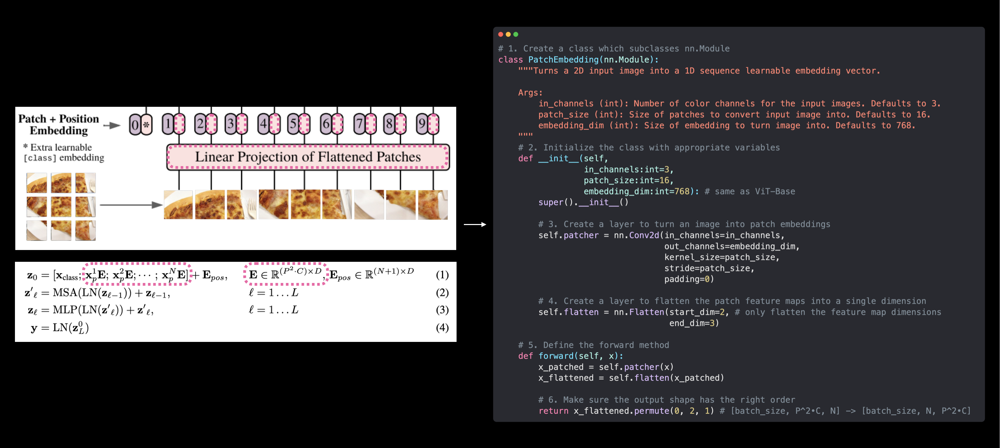

In [29]:
random_input_image= (1,3,224,224)
random_input_image_error= (1,3,250,250)
summary(PatchEmbedding(),input_size= random_input_image, col_names= ["input_size", "output_size", "num_params", "trainable"], col_width= 20, row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
PatchEmbedding (PatchEmbedding)          [1, 3, 224, 224]     [1, 196, 768]        --                   True
├─Conv2d (patcher)                       [1, 3, 224, 224]     [1, 768, 14, 14]     590,592              True
├─Flatten (flatten)                      [1, 768, 14, 14]     [1, 768, 196]        --                   --
Total params: 590,592
Trainable params: 590,592
Non-trainable params: 0
Total mult-adds (M): 115.76
Input size (MB): 0.60
Forward/backward pass size (MB): 1.20
Params size (MB): 2.36
Estimated Total Size (MB): 4.17

In [30]:
print(patch_embedded_image)
print(f"{patch_embedded_image.shape}-> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[-0.5901,  0.1245, -0.1907,  ...,  0.3998, -0.2312,  0.2171],
         [-0.6001,  0.0907, -0.1921,  ...,  0.4377, -0.2756,  0.2316],
         [-0.2896,  0.0821, -0.2080,  ...,  0.1916, -0.1891,  0.1660],
         ...,
         [-0.7472,  0.1446, -0.1663,  ...,  0.5064, -0.3603,  0.2896],
         [-0.7809,  0.1503, -0.1632,  ...,  0.5124, -0.3632,  0.2815],
         [-0.7689,  0.1607, -0.1681,  ...,  0.5197, -0.3653,  0.2853]]],
       grad_fn=<PermuteBackward0>)
torch.Size([1, 196, 768])-> [batch_size, number_of_patches, embedding_dimension]


## *Creating the class token embedding*
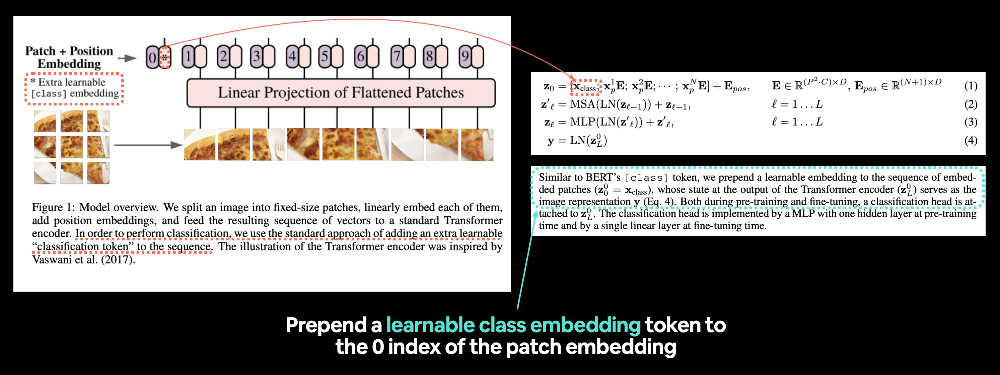


In [31]:
batch_size= patch_embedded_image.shape[0]
embedding_dimension= patch_embedded_image.shape[-1]

class_token= nn.Parameter(torch.ones(batch_size, 1,embedding_dimension), requires_grad= True)
class_token[:,:,:5], class_token.shape

(tensor([[[1., 1., 1., 1., 1.]]], grad_fn=<SliceBackward0>),
 torch.Size([1, 1, 768]))

In [32]:
patch_embedded_image_with_class_embedding= torch.cat((class_token, patch_embedded_image), dim= 1)
print(patch_embedded_image_with_class_embedding)
print(f"Sequence of patch embedding with prepend class token:{patch_embedded_image_with_class_embedding.shape}")

tensor([[[ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
         [-0.5901,  0.1245, -0.1907,  ...,  0.3998, -0.2312,  0.2171],
         [-0.6001,  0.0907, -0.1921,  ...,  0.4377, -0.2756,  0.2316],
         ...,
         [-0.7472,  0.1446, -0.1663,  ...,  0.5064, -0.3603,  0.2896],
         [-0.7809,  0.1503, -0.1632,  ...,  0.5124, -0.3632,  0.2815],
         [-0.7689,  0.1607, -0.1681,  ...,  0.5197, -0.3653,  0.2853]]],
       grad_fn=<CatBackward0>)
Sequence of patch embedding with prepend class token:torch.Size([1, 197, 768])


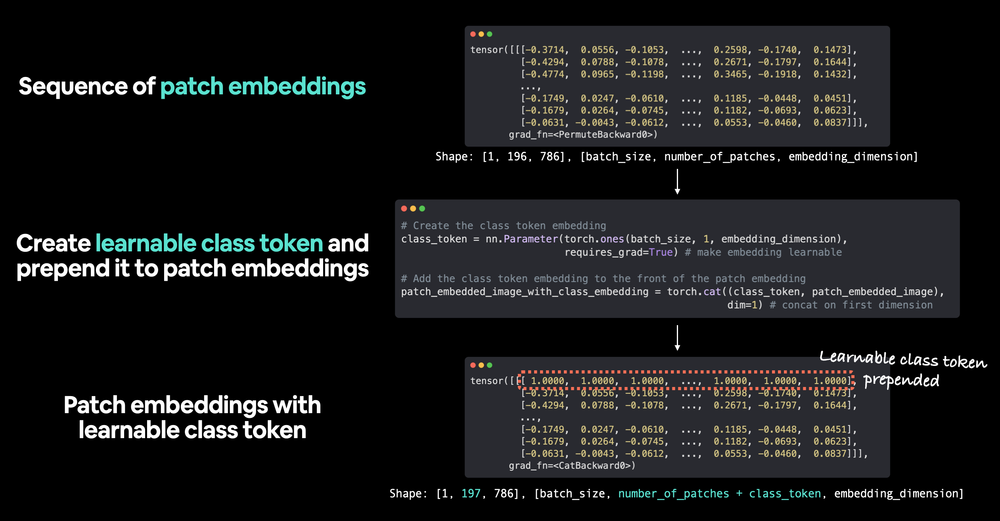

## *Creating the position embedding*
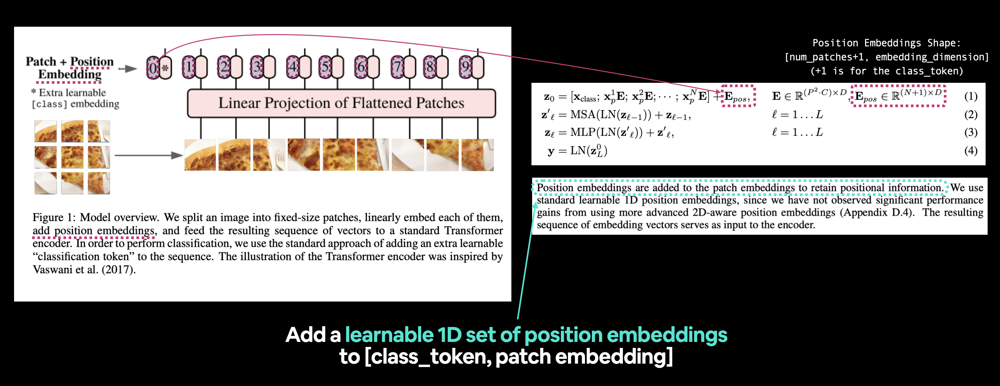


In [33]:
number_of_patches = int((height * width) / patch_size**2)

embedding_dimension = patch_embedded_image_with_class_embedding.shape[2]

position_embedding = nn.Parameter(torch.ones(1, number_of_patches+1, embedding_dimension), requires_grad=True) # make sure it's learnable

print(position_embedding[:, :10, :10])
print(f"Position embeddding shape: {position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

tensor([[[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
         [1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]], grad_fn=<SliceBackward0>)
Position embeddding shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


In [34]:
# Add the position embedding to the patch and class token embedding
patch_and_position_embedding = patch_embedded_image_with_class_embedding + position_embedding
print(patch_and_position_embedding)
print(f"Patch embeddings, class token prepended and positional embeddings added shape: {patch_and_position_embedding.shape}")

tensor([[[2.0000, 2.0000, 2.0000,  ..., 2.0000, 2.0000, 2.0000],
         [0.4099, 1.1245, 0.8093,  ..., 1.3998, 0.7688, 1.2171],
         [0.3999, 1.0907, 0.8079,  ..., 1.4377, 0.7244, 1.2316],
         ...,
         [0.2528, 1.1446, 0.8337,  ..., 1.5064, 0.6397, 1.2896],
         [0.2191, 1.1503, 0.8368,  ..., 1.5124, 0.6368, 1.2815],
         [0.2311, 1.1607, 0.8319,  ..., 1.5197, 0.6347, 1.2853]]],
       grad_fn=<AddBackward0>)
Patch embeddings, class token prepended and positional embeddings added shape: torch.Size([1, 197, 768])


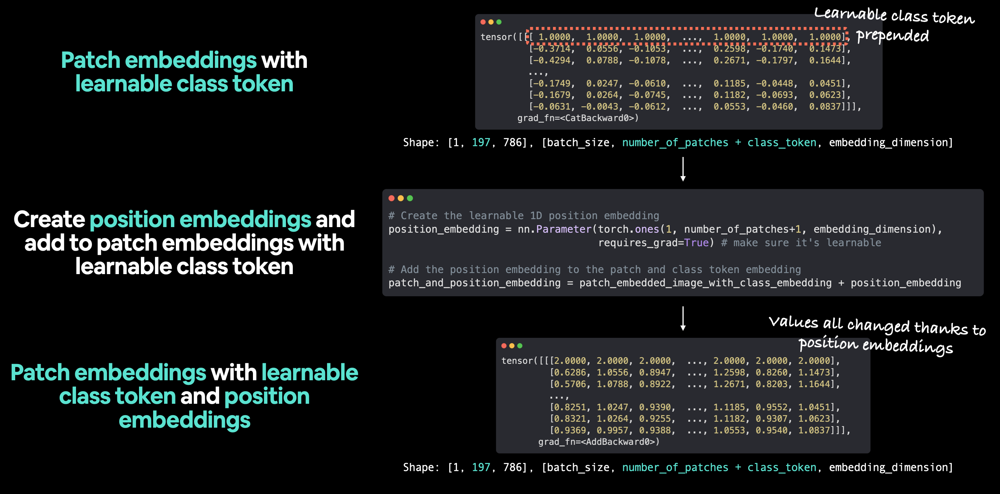

In [64]:
set_seeds()

# 1. Set patch size
patch_size = 16

# 2. Print shape of original image tensor and get the image dimensions
print(f"Image tensor shape: {img.shape}")
height, width = img.shape[1], img.shape[2]

# 3. Get image tensor and add batch dimension
x = img.unsqueeze(0)
print(f"Input image with batch dimension shape: {x.shape}")

# 4. Create patch embedding layer
patch_embedding_layer = PatchEmbedding(in_channels=3, patch_size=patch_size, embedding_dim=768)

# 5. Pass image through patch embedding layer
patch_embedding = patch_embedding_layer(x)
print(f"Patching embedding shape: {patch_embedding.shape}")

# 6. Create class token embedding
batch_size = patch_embedding.shape[0]
embedding_dimension = patch_embedding.shape[-1]
class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension), requires_grad=True) # make sure it's learnable
print(f"Class token embedding shape: {class_token.shape}")

# 7. Prepend class token embedding to patch embedding
patch_embedding_class_token = torch.cat((class_token, patch_embedding), dim=1)
print(f"Patch embedding with class token shape: {patch_embedding_class_token.shape}")

# 8. Create position embedding
number_of_patches = int((height * width) / patch_size**2)
position_embedding = nn.Parameter(torch.ones(1, number_of_patches+1, embedding_dimension), requires_grad=True) # make sure it's learnable

# 9. Add position embedding to patch embedding with class token
patch_and_position_embedding = patch_embedding_class_token + position_embedding
print(f"Patch and position embedding shape: {patch_and_position_embedding.shape}")

Image tensor shape: torch.Size([3, 224, 224])
Input image with batch dimension shape: torch.Size([1, 3, 224, 224])
Patching embedding shape: torch.Size([1, 196, 768])
Class token embedding shape: torch.Size([1, 1, 768])
Patch embedding with class token shape: torch.Size([1, 197, 768])
Patch and position embedding shape: torch.Size([1, 197, 768])


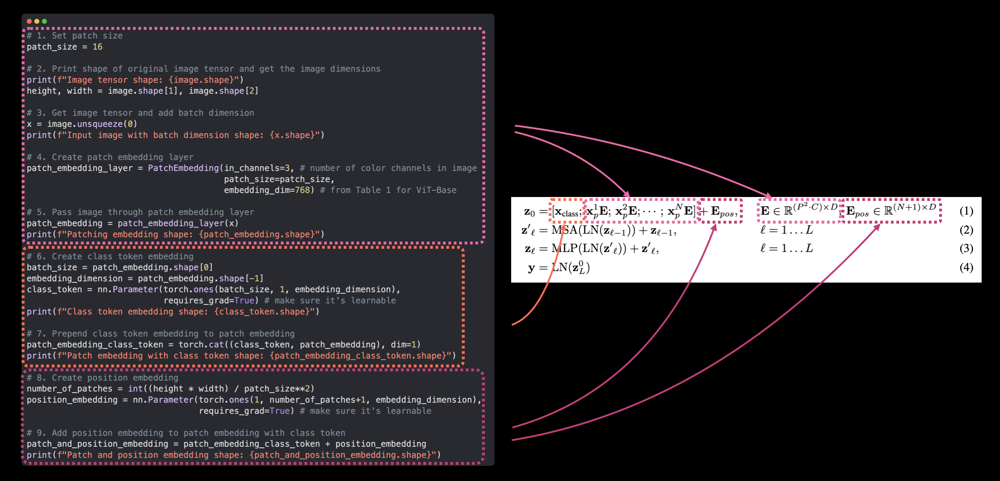

### *Equation 2: Multi-Head Attention (MSA)*
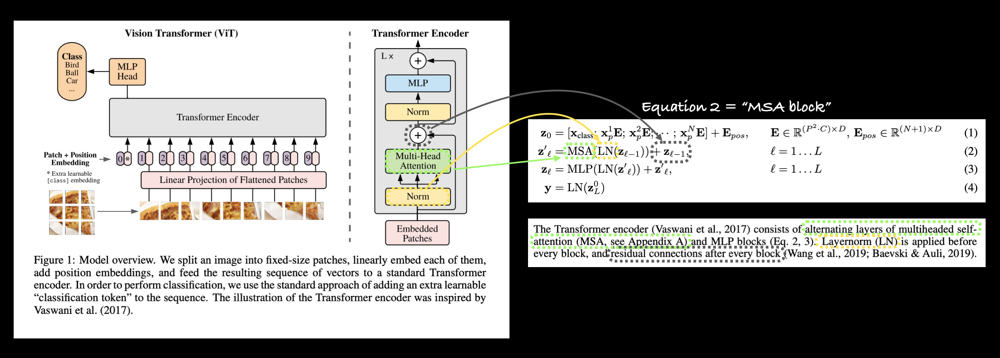

### *The Multi-Head Self Attention (MSA) layer*
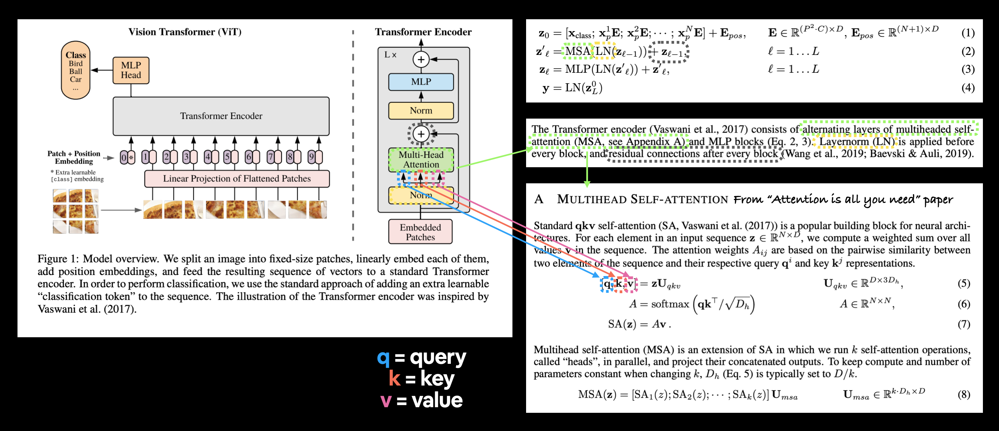

## *Replicating Equation 2 with PyTorch layers*

In [37]:
class MultiheadSelfAttentionBlock(nn.Module):
  def __init__(self, embedding_dim: int= 768, num_heads: int= 12, attn_dropout:float=0):
    super().__init__()

    self.layer_norm= nn.LayerNorm(normalized_shape= embedding_dim)
    self.multihead_attn= nn.MultiheadAttention(embed_dim= embedding_dim, num_heads= num_heads, dropout= attn_dropout, batch_first= True)

  def forward(self, x):
    x= self.layer_norm(x)
    attn_output, _= self.multihead_attn(key=x, query= x, value= x)
    return attn_output


In [38]:
multihead_self_attention_block= MultiheadSelfAttentionBlock(embedding_dim= 768, num_heads= 12)
patch_image_through_msa_block= multihead_self_attention_block(patch_and_position_embedding)
print(f"Patch_and_position_embedding shape:{patch_and_position_embedding.shape}")
print(f"Patch image through msa block shape:{patch_image_through_msa_block.shape}")

Patch_and_position_embedding shape:torch.Size([1, 197, 768])
Patch image through msa block shape:torch.Size([1, 197, 768])


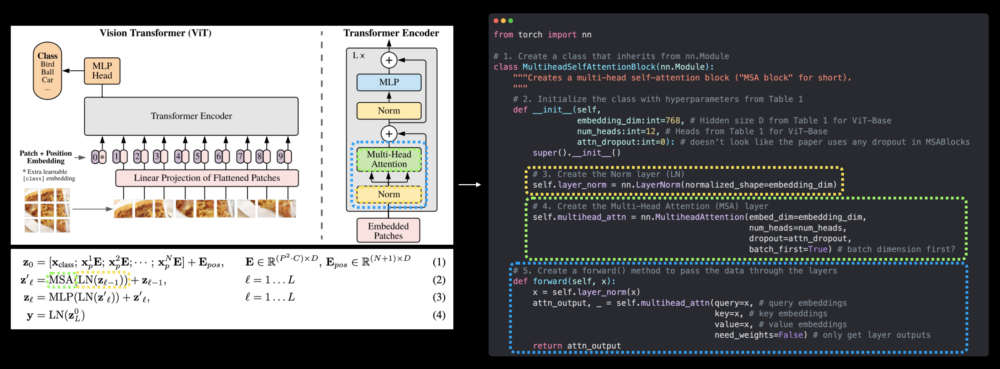

## *Equation 3: Multilayer Perceptron (MLP)*
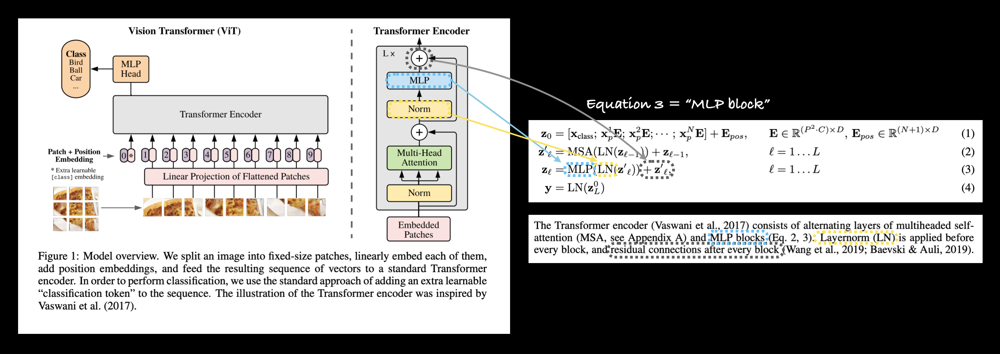

### *Replicating Equation 3 with PyTorch layers*

In [39]:
class MLPBlock(nn.Module):
  def __init__(self, embedding_dim: int=768, mlp_size: int= 3072, dropout: int= 0.1):
    super().__init__()

    self.layer_norm= nn.LayerNorm(normalized_shape= embedding_dim)
    self.mlp= nn.Sequential(
        
        nn.Linear(in_features= embedding_dim, out_features= mlp_size),
        nn.GELU(),
        nn.Dropout(dropout),

        nn.Linear(in_features= mlp_size, out_features= embedding_dim),
        nn.GELU(),
        nn.Dropout(dropout)
    )

  def forward(self, x):
    
    x= self.layer_norm(x)
    x= self.mlp(x)
    return x


In [40]:
mlp= MLPBlock(embedding_dim= 768, mlp_size= 3072)
patch_image_through_mlpblock= mlp(patch_image_through_msa_block)
print(f"Patch image through MSA block:{patch_image_through_msa_block.shape}")
print(f"Patch image through MLP block:{patch_image_through_mlpblock.shape}")

Patch image through MSA block:torch.Size([1, 197, 768])
Patch image through MLP block:torch.Size([1, 197, 768])


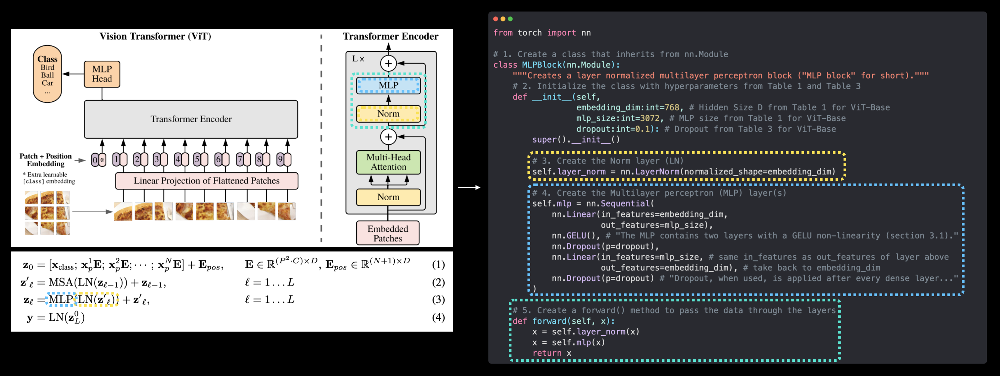

### *Creating a Transformer Encoder by combining our custom made layers*

In [41]:
class TransformerEncoderBlock(nn.Module):
  def __init__(self, embedding_dim: int=768, num_heads:int=12, mlp_size: int= 3072, mlp_dropout: int= 0.1, attn_dropout: int=0):
    super().__init__()

    self.msa_block= MultiheadSelfAttentionBlock(embedding_dim= embedding_dim, num_heads= num_heads, attn_dropout= attn_dropout)
    self.mlp_block= MLPBlock(embedding_dim= embedding_dim, mlp_size= mlp_size, dropout= mlp_dropout)

  def forward(self,x):

    x= self.msa_block(x) + x
    x= self.mlp_block(x) + x
    return x


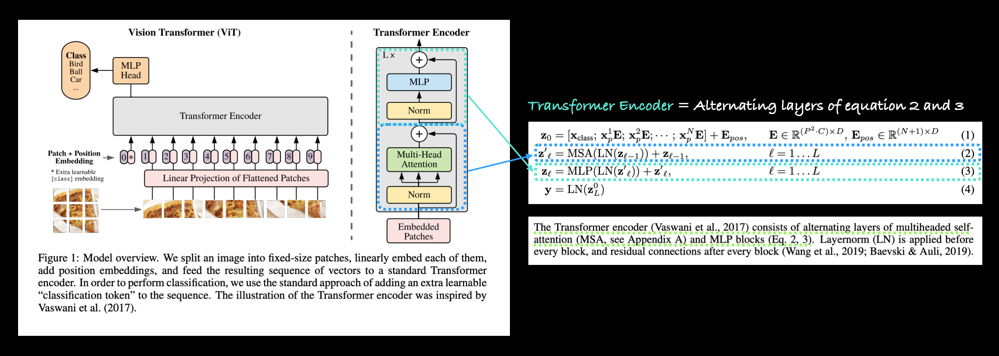

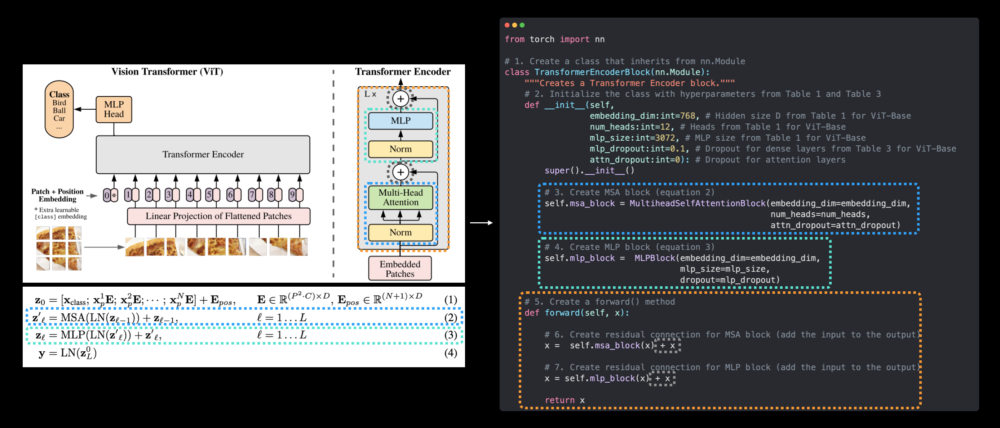

In [42]:
transformer_encoder_block= TransformerEncoderBlock()

summary(model= transformer_encoder_block, input_size= (1,197, 768), col_names= ["input_size", "output_size","num_params","trainable"], col_width= 20, 
        row_settings=["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
TransformerEncoderBlock (TransformerEncoderBlock)  [1, 197, 768]        [1, 197, 768]        --                   True
├─MultiheadSelfAttentionBlock (msa_block)          [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─MultiheadAttention (multihead_attn)         --                   [1, 197, 768]        2,362,368            True
├─MLPBlock (mlp_block)                             [1, 197, 768]        [1, 197, 768]        --                   True
│    └─LayerNorm (layer_norm)                      [1, 197, 768]        [1, 197, 768]        1,536                True
│    └─Sequential (mlp)                            [1, 197, 768]        [1, 197, 768]        --                   True
│    │    └─Linear (0)                     

### *Creating a Transformer Encoder with PyTorch's Transformer layers*

In [43]:
torch_transformer_encoder_layer= nn.TransformerEncoderLayer(d_model= 768, nhead=12, dim_feedforward=3072, dropout= 0.1, activation="gelu",
                                                            batch_first= True, norm_first= True)
print(torch_transformer_encoder_layer)

TransformerEncoderLayer(
  (self_attn): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
  )
  (linear1): Linear(in_features=768, out_features=3072, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
  (linear2): Linear(in_features=3072, out_features=768, bias=True)
  (norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  (norm2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  (dropout1): Dropout(p=0.1, inplace=False)
  (dropout2): Dropout(p=0.1, inplace=False)
)


In [44]:
summary(model= torch_transformer_encoder_layer, input_size= (1, 197, 768), col_names= ["input_size", "output_size", "num_params", "trainable"], 
        col_width= 20, row_settings= ["var_names"])

Layer (type (var_name))                            Input Shape          Output Shape         Param #              Trainable
TransformerEncoderLayer (TransformerEncoderLayer)  [1, 197, 768]        [1, 197, 768]        7,087,872            True
Total params: 7,087,872
Trainable params: 7,087,872
Non-trainable params: 0
Total mult-adds (M): 0
Input size (MB): 0.61
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.61

### *Putting it all together to create ViT*

In [45]:
class ViT(nn.Module):
  def __init__(self, img_size:int=224, in_channels: int= 3, patch_size: int= 16, num_transformer_layers: int=12, embedding_dim: int= 768, mlp_size: int= 3072,
               num_heads: int= 12, attn_dropout: int=0, mlp_dropout: float= 0.1, embedding_dropout: float= 0.1, num_classes: int= 1000):
    super().__init__()

    assert img_size % patch_size == 0, f"image size must be devisible to  patch size, image size: {img_size} Patch size: {patch_size}."

    self.num_patches= img_size**2// patch_size**2
    self.class_embedding= nn.Parameter(data= torch.randn(1,1,embedding_dim), requires_grad= True)
    self.position_embedding= nn.Parameter(data= torch.randn(1, self.num_patches+ 1, embedding_dim), requires_grad= True)
    self.embedding_dropout= nn.Dropout(embedding_dropout)
    self.patch_embedding= PatchEmbedding(in_channels= in_channels, patch_size= patch_size, embedding_dim= embedding_dim)
    self.transformer_encoder= nn.Sequential(*[TransformerEncoderBlock(embedding_dim= embedding_dim, mlp_size= mlp_size, mlp_dropout= mlp_dropout,
                                                                      num_heads= num_heads) for _ in range(num_transformer_layers)])
    self.classifier= nn.Sequential(
        
        nn.LayerNorm(normalized_shape= embedding_dim),
        nn.Linear(in_features= embedding_dim, out_features= num_classes) 

    )

  def forward(self, x):

    batch_size= x.shape[0]
    class_token= self.class_embedding.expand(batch_size, -1,-1)
    x= self.patch_embedding(x)
    x= torch.cat((class_token, x), dim= 1)
    x= self.position_embedding + x
    x = self.embedding_dropout(x)
    x= self.transformer_encoder(x)
    x= self.classifier(x[:,0])
    return x

    

In [46]:
batch_size= 32

class_token_embedding_single= nn.Parameter(data= torch.randn(1,1, 768))
class_token_expand= class_token_embedding_single.expand(batch_size,-1,-1)

print(f"Shapes of class token embedding single:{class_token_embedding_single.shape}")
print(f"Shapes of class token embedding expand:{class_token_expand.shape}")


Shapes of class token embedding single:torch.Size([1, 1, 768])
Shapes of class token embedding expand:torch.Size([32, 1, 768])


In [47]:
set_seeds()

random_image_tensor= torch.randn(1,3,224,224)

vit= ViT(num_classes= len(class_names))

vit(random_image_tensor)




tensor([[-0.1453,  0.9286,  1.3715]], grad_fn=<AddmmBackward0>)

### *Getting a visual summary of our ViT model*

In [48]:
summary(model= vit, input_size=(32, 3, 224,224), col_names= ["input_size", "output_size","num_params", "trainable"],col_width= 20, row_settings= ["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
ViT (ViT)                                                    [32, 3, 224, 224]    [32, 3]              152,064              True
├─PatchEmbedding (patch_embedding)                           [32, 3, 224, 224]    [32, 196, 768]       --                   True
│    └─Conv2d (patcher)                                      [32, 3, 224, 224]    [32, 768, 14, 14]    590,592              True
│    └─Flatten (flatten)                                     [32, 768, 14, 14]    [32, 768, 196]       --                   --
├─Dropout (embedding_dropout)                                [32, 197, 768]       [32, 197, 768]       --                   --
├─Sequential (transformer_encoder)                           [32, 197, 768]       [32, 197, 768]       --                   True
│    └─TransformerEncoderBlock (0)                           [32, 197, 768]       [32, 197, 768]

### *Training our ViT model*

In [49]:
from going_modular.going_modular import engine

optimizer= torch.optim.Adam(params= vit.parameters(), lr= 3e-3, betas=(0.9, 0.999), weight_decay= 0.3)

loss_fn= torch.nn.CrossEntropyLoss()
set_seeds()

results= engine.train(model= vit, train_dataloader= train_dataloader, test_dataloader= test_dataloader, optimizer= optimizer, 
                      loss_fn= loss_fn, epochs=10, device= device)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 3.5254 | train_acc: 0.2852 | test_loss: 2.9813 | test_acc: 0.2604
Epoch: 2 | train_loss: 1.5476 | train_acc: 0.2930 | test_loss: 1.6277 | test_acc: 0.2604
Epoch: 3 | train_loss: 1.1830 | train_acc: 0.4141 | test_loss: 1.4996 | test_acc: 0.2604
Epoch: 4 | train_loss: 1.2162 | train_acc: 0.4023 | test_loss: 1.1999 | test_acc: 0.1979
Epoch: 5 | train_loss: 1.1351 | train_acc: 0.3164 | test_loss: 1.1487 | test_acc: 0.2604
Epoch: 6 | train_loss: 1.1822 | train_acc: 0.3047 | test_loss: 1.2896 | test_acc: 0.1979
Epoch: 7 | train_loss: 1.3262 | train_acc: 0.2734 | test_loss: 1.0787 | test_acc: 0.2604
Epoch: 8 | train_loss: 1.1227 | train_acc: 0.2656 | test_loss: 1.1970 | test_acc: 0.2604
Epoch: 9 | train_loss: 1.1419 | train_acc: 0.3047 | test_loss: 1.0114 | test_acc: 0.5417
Epoch: 10 | train_loss: 1.2758 | train_acc: 0.2578 | test_loss: 1.4463 | test_acc: 0.2604


### *Plot the loss curves of our ViT model*

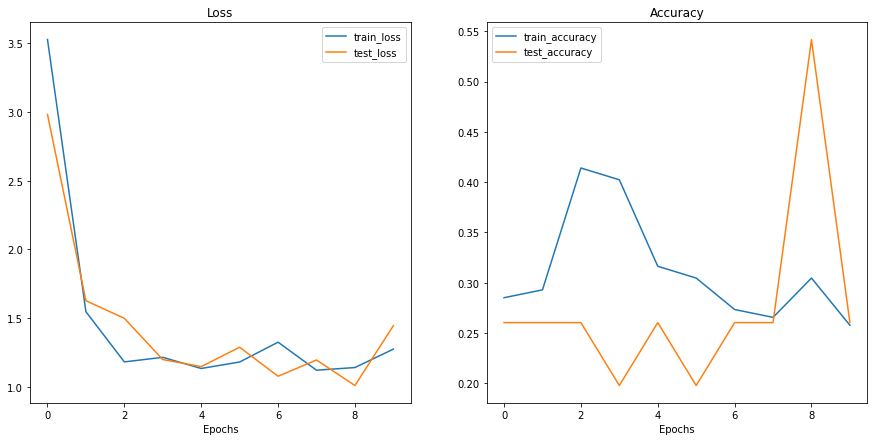

In [50]:
from helper_functions import plot_loss_curves

plot_loss_curves(results)

## *Using a pretrained ViT from torchvision.models on the same dataset*

In [51]:
import torch
import torchvision
print(f" torch version:{torch.__version__}")
print(f"torchvision version:{torchvision.__version__}")

 torch version:1.13.1+cu116
torchvision version:0.14.1+cu116


In [52]:
device= "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [53]:
pretrained_vit_weights= torchvision.models.ViT_B_16_Weights.DEFAULT

pretrained_vit= torchvision.models.vit_b_16(weights= pretrained_vit_weights).to(device)

for parameter in pretrained_vit.parameters():
  parameter.requires_grad= False

set_seeds()
pretrained_vit.heads= nn.Linear(in_features= 768, out_features= len(class_names)).to(device)

pretrained_vit

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


  0%|          | 0.00/330M [00:00<?, ?B/s]

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [54]:
summary(model=pretrained_vit, input_size= (32,3,224,224), col_names= ["input_size","output_size", "num_params","trainable"], 
        col_width= 20, row_settings= ["var_names"])

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [32, 3, 224, 224]    [32, 3]              768                  Partial
├─Conv2d (conv_proj)                                         [32, 3, 224, 224]    [32, 768, 14, 14]    (590,592)            False
├─Encoder (encoder)                                          [32, 197, 768]       [32, 197, 768]       151,296              False
│    └─Dropout (dropout)                                     [32, 197, 768]       [32, 197, 768]       --                   --
│    └─Sequential (layers)                                   [32, 197, 768]       [32, 197, 768]       --                   False
│    │    └─EncoderBlock (encoder_layer_0)                   [32, 197, 768]       [32, 197, 768]       (7,087,872)          False
│    │    └─EncoderBlock (encoder_layer_1)                   [32, 197, 768]       [32, 

## *Using a pretrained ViT from torchvision.models on the same dataset*

In [55]:
from helper_functions import download_data
image_path= download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip", destination= "pizza_steak_sushi")
image_path

[INFO] data/pizza_steak_sushi directory exists, skipping download.


PosixPath('data/pizza_steak_sushi')

In [56]:
train_dir= image_path/ "train"
test_dir= image_path/"test"
train_dir, test_dir

(PosixPath('data/pizza_steak_sushi/train'),
 PosixPath('data/pizza_steak_sushi/test'))

In [57]:
pretrained_vit_transforms= pretrained_vit_weights.transforms()
print(pretrained_vit_transforms)

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)


In [58]:
train_dataloader_pretrained, test_dataloader_pretrained, class_names= data_setup.create_dataloaders(train_dir= train_dir, test_dir= test_dir,
                                                                                              transform= pretrained_vit_transforms, batch_size= 32)
train_dataloader_pretrained, test_dataloader_pretrained, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7f5a0c612a30>,
 ['pizza', 'steak', 'sushi'])

### *Train feature extractor ViT model*

In [59]:
from going_modular.going_modular import engine

optimizer= torch.optim.Adam(params= pretrained_vit.parameters(), lr= 1e-3)
loss_fn= torch.nn.CrossEntropyLoss()

set_seeds()
pretrained_vit_results= engine.train(model= pretrained_vit, train_dataloader= train_dataloader_pretrained, test_dataloader= test_dataloader_pretrained,
                                     optimizer= optimizer, loss_fn= loss_fn, epochs= 10, device= device)



  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.7665 | train_acc: 0.7227 | test_loss: 0.5432 | test_acc: 0.8665
Epoch: 2 | train_loss: 0.3428 | train_acc: 0.9453 | test_loss: 0.3263 | test_acc: 0.8977
Epoch: 3 | train_loss: 0.2064 | train_acc: 0.9531 | test_loss: 0.2707 | test_acc: 0.9081
Epoch: 4 | train_loss: 0.1556 | train_acc: 0.9570 | test_loss: 0.2422 | test_acc: 0.9081
Epoch: 5 | train_loss: 0.1246 | train_acc: 0.9727 | test_loss: 0.2279 | test_acc: 0.8977
Epoch: 6 | train_loss: 0.1216 | train_acc: 0.9766 | test_loss: 0.2129 | test_acc: 0.9280
Epoch: 7 | train_loss: 0.0938 | train_acc: 0.9766 | test_loss: 0.2352 | test_acc: 0.8883
Epoch: 8 | train_loss: 0.0797 | train_acc: 0.9844 | test_loss: 0.2281 | test_acc: 0.8778
Epoch: 9 | train_loss: 0.1098 | train_acc: 0.9883 | test_loss: 0.2074 | test_acc: 0.9384
Epoch: 10 | train_loss: 0.0650 | train_acc: 0.9883 | test_loss: 0.1804 | test_acc: 0.9176


### *Plot feature extractor ViT model loss curves*

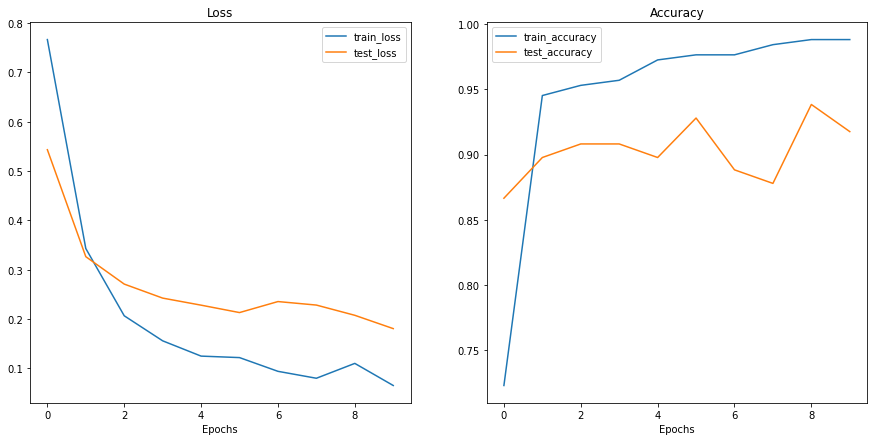

In [60]:
from helper_functions import plot_loss_curves
plot_loss_curves(pretrained_vit_results)

### *Save feature extractor ViT model and check file size*

In [61]:
from going_modular.going_modular import utils

utils.save_model(model= pretrained_vit, target_dir= "models", model_name= "08_pretrained_vit_extrctor_pizza_steak_sushi.pth")

[INFO] Saving model to: models/08_pretrained_vit_extrctor_pizza_steak_sushi.pth


In [62]:
from pathlib import Path

pretrained_vit_model_size= Path('/content/models/08_pretrained_vit_extrctor_pizza_steak_sushi.pth').stat().st_size // (1024*1024)
print(f"Pretrained Vit feature extractor model size:{pretrained_vit_model_size} MB.")

Pretrained Vit feature extractor model size:327 MB.


### *Make predictions on a custom image*

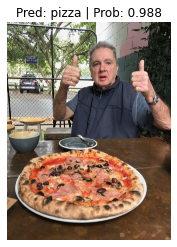

In [63]:
from going_modular.going_modular.predictions import pred_and_plot_image
import requests

custom_image_path= image_path/ "pizza_dad.jpeg"

if not custom_image_path.is_file():
  with open(custom_image_path, "wb") as f:
    request= requests.get("https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/04-pizza-dad.jpeg")
    print(f"Downloading {custom_image_path}. .")
    f.write(request.content)

else:
  print(f"{custom_image_path} already exists, skipping download.")


pred_and_plot_image(model= pretrained_vit, image_path= custom_image_path, class_names= class_names)


